# BMEN 509 Project ABC-DISC

Details/Information


https://www.geeksforgeeks.org/python-blood-cell-identification-using-image-processing/

In [1]:
# Library Imports
import os
import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage import color
from scipy import signal, ndimage

# Setup Jupyter notebook specifics
%matplotlib inline

# Numpy printing help
np.set_printoptions(precision=2)

In [2]:
# New Libary Imports

# For finding files
import glob 

# For Cell Detection
!python -m pip install opencv-python==4.1.2.30
import cv2

# Finding Files

In [3]:
# Function to find file path
# Taken from Lab 3 
def find_files(directory, re):
    '''Given a directory and a regular expression, find all files that match in that directory.'''
    # Test the directory exists
    if not os.path.isdir(directory):
        os.sys.exit('Cannot find directory {}. Exiting...'.format(directory))

    # Find files
    files = sorted(glob.glob(os.path.join(directory, re)))

    return files

In [4]:
# Location of our files
input_directory = os.path.join('.', 'Data')
data_regular_expression = 'image-*.png'

# Read files
files = find_files(input_directory, data_regular_expression)
print('Found {} files'.format(len(files)))

Found 100 files



# Cell Detection

In [5]:
# Read & Load image
def Read_Img(name):
    #filename = os.path.join(data_directory, name) 
    
    return cv2.imread(name)

In [6]:
# Constrast stretching Function 
# Map each intensity level to an output intensity level
def pixelVal(pix, r1, s1, r2, s2): 
    if (0 <= pix and pix <= r1): 
        return (s1 / r1) * pix 
    elif (r1 < pix and pix <= r2): 
        return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1 
    else: 
        return ((255 - s2) / (255 - r2)) * (pix - r2) + s2 

In [7]:
# Enhance function plotting
# For testing purposes
def Enhance_Plots(image,gray,blurM,blurG,histoNorm,claheNorm,cs_all,cs_white,edge_all,edge_white):
    plt.subplots(1, 2, figsize=(10, 10))
    plt.subplot(121); plt.imshow(image); plt.title('Original Image')
    plt.subplot(122); plt.imshow(gray,cmap='gray'); plt.title('Gray Scaled Image')
    plt.show()
    
    plt.subplots(1,4,figsize=(20,20))
    plt.subplot(141); plt.imshow(blurM,cmap='gray'); plt.title('Median Filter/ blurM')
    plt.subplot(142); plt.imshow(blurG,cmap='gray'); plt.title('Guassian Filter / blurG')
    plt.subplot(143); plt.imshow(histoNorm,cmap='gray'); plt.title('Histogram Equalization')
    plt.subplot(144); plt.imshow(claheNorm,cmap='gray'); plt.title('Adaptive Histogram Equalization')
    plt.show()

    plt.subplots(1,2, figsize=(10,10))
    plt.subplot(121); plt.imshow(cs_all,cmap='gray'); plt.title('Contrast Stretch, All ')
    plt.subplot(122); plt.imshow(cs_white,cmap='gray'); plt.title('Contrast Stretch, White')
    plt.show()

    plt.subplots(1,2, figsize=(10,10))
    plt.subplot(121); plt.imshow(edge_all,cmap='gray'); plt.title('Edge Detection, All')
    plt.subplot(122); plt.imshow(edge_white,cmap='gray'); plt.title('Edge Detection, White')
    plt.show()

In [8]:
# Enhance Function
# Edge detection of image for all cells and white blood cells
def Enhance(file_name):
    # Reading in function
    image = Read_Img(file_name)
    # Convert to grey-scale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Histogram for analysis
    # Comment out whenever
    """
    plt.hist(gray.ravel(), bins=256); plt.xlabel('Intensity'); plt.ylabel('Count')
    plt.title('Histogram of Grayscale Blood Cell Image with 256 Bins')
    plt.show()
    """
    
    # Apply median filter for smoothning
    blurM = cv2.medianBlur(gray, 5)
    # Apply gaussian filter for smoothning
    blurG = cv2.GaussianBlur(blurM, (9, 9), 0)
    # Histogram equalization
    histoNorm = cv2.equalizeHist(blurG)
    # Contrast Limited Adaptive Histogram Equalization (CLAHE)
    clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize=(8, 8))
    claheNorm = clahe.apply(histoNorm)
    
    #Vectorize the Contrast Stretching function
    pixelVal_vec = np.vectorize(pixelVal) 
    
    # Apply contrast stretching
    # For all cells 
    con_str_all = pixelVal_vec(claheNorm, 120, 0, 140, 255)
    # For white blood cells
    con_str_white = pixelVal_vec(claheNorm, 0, 0, 25, 255)
    
    # Canny Edge Detection
    # For all cells
    edge_all = cv2.Canny( np.uint8(con_str_all*255) ,100,200)
    # For white cells
    edge_white = cv2.Canny( np.uint8(con_str_white*255) ,100,200)
    
    # Test Plotting
    # Comment out whenever
    """
    Enhance_Plots(image,gray,blurM,blurG,histoNorm,claheNorm,
                  con_str_all,con_str_white,edge_all,edge_white)
    """
    
    return edge_all,edge_white
    

In [9]:
# Detection function
# Detect cells according to edge detection
def Detect(img, name, T):
    
    # Test Plotting
    # Comment out whenever
    """ 
    plt.imshow(img, cmap='gray'); plt.title("Edge Detection for Circle Detection")
    plt.show()
    """
    
    # Morphological operations
    kernel = np.ones((5, 5), np.uint8) 
    dilation = cv2.dilate(img, kernel, iterations = 1) 
    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) 
    
    # Adaptive thresholding on mean and Gaussian filters
    th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,\
                            cv2.THRESH_BINARY, 11, 2) 
    th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                            cv2.THRESH_BINARY, 11, 2) 
    
    # Otsu's thresholding
    ret4, th4 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Hough transform with modified circular parameters 
    circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 1.2, 20,  
                 param1 = 50, param2 = 28, minRadius = 20, maxRadius = 40)

    # Read original image to display the circle and centre detection 
    #filename = os.path.join(data_directory, name) 
    display = cv2.imread(name) 
    # Initialize the list 
    Cell_count, x_count, y_count = [], [], [] 

    # Circle detection and labelling using Hough transformation
    if circles is not None: 
            # convert the (x, y) coordinates and radius of the circles to integers 
            #circles = np.round(circles[0, :]).astype("int")   
            circles = np.uint16(np.around(circles))
        
            # loop over the (x, y) coordinates and radius of the circles 
            # For (x, y, r) in circles[0,:]: 
            for i in circles[0,:]:
                    x = i[0];
                    y = i[1];
                    r = i[2];
                    cv2.circle(display, (x, y), r, (0, 255, 0), 2) 
                    cv2.rectangle(display, (x - 2, y - 2),  
                                  (x + 2, y + 2), (0, 128, 255), -1) 
                    Cell_count.append(r) 
                    x_count.append(x) 
                    y_count.append(y)
                    
    else: #No Cells detected
        if T==1: #For all cells
            #os.sys.exit("ERROR: No cells were detected for All Cells for {}".format(os.path.basename(name)))
            return display, 0
        else: #For white blood cells
            #os.sys.exit("ERROR: No cells were detected for White Blood Cells for {}".format(os.path.basename(name)))
            return display, 0
        return

    return display,len(Cell_count)


In [10]:
# All in one function, Name WIP
# Combines above function
def All_in_One(Name):
    #Edge detection for all cells and white blood cells
    edge_all,edge_white = Enhance(Name)
    
    #Cell Detection for All cells
    img_all, count_all = Detect(edge_all,Name,1)
    #Cell Detection for All cells
    img_white, count_white = Detect(edge_white,Name,0)

    # Test Plotting & Statistic
    # Comment out whenever
    
    plt.subplots(1,2, figsize=(10,10))
    plt.subplot(121); plt.imshow(cv2.cvtColor(img_all, cv2.COLOR_BGR2RGB)); plt.title("All Cell Detection")   
    plt.subplot(122); plt.imshow(cv2.cvtColor(img_white, cv2.COLOR_BGR2RGB)); plt.title("White Blood Cell Detection")
    plt.show()
    """
    print("All = \t{}".format(count_all))
    print("WBC = {}".format(count_white))
    print("RBC = \t{}".format(count_all-count_white))
    """
    
    return count_all, count_white, count_all-count_white
    

# Image Iteration

Image		All	WBC	RBC 



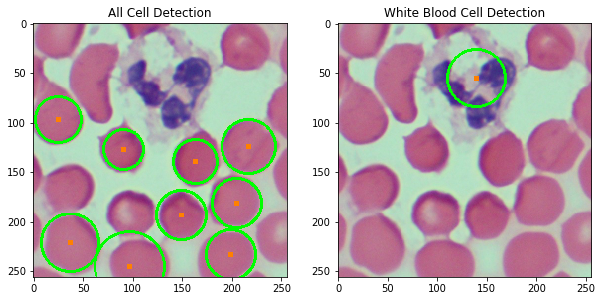

image-1.png	9	1	8


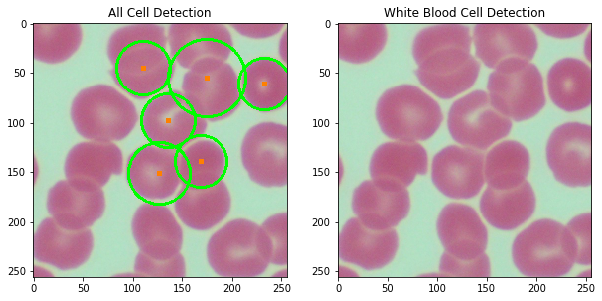

image-10.png	6	0	6


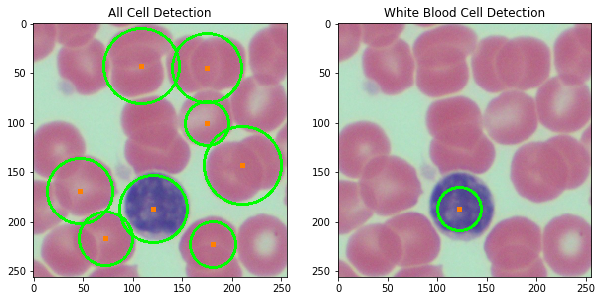

image-100.png	8	1	7


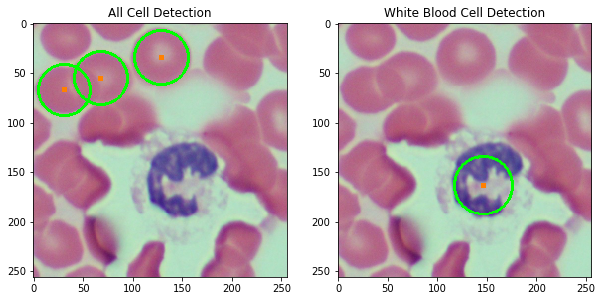

image-101.png	3	1	2


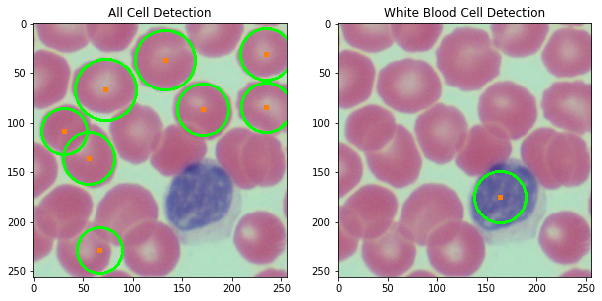

image-102.png	8	1	7


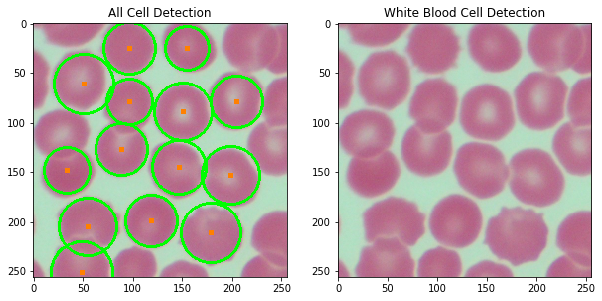

image-103.png	14	0	14


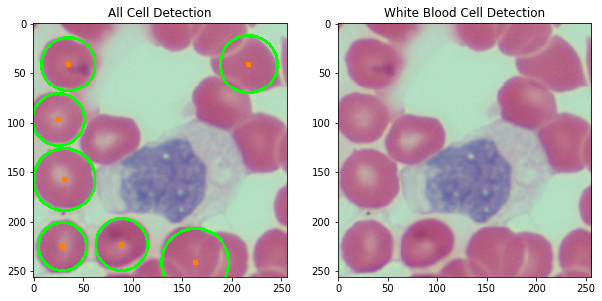

image-104.png	7	0	7


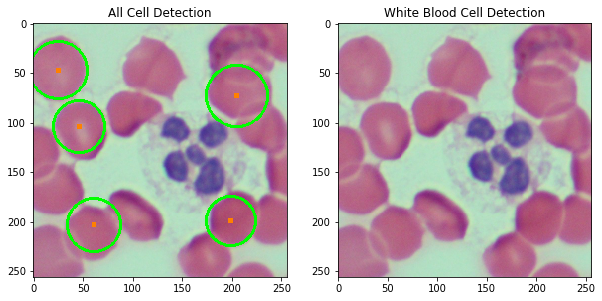

image-105.png	5	0	5


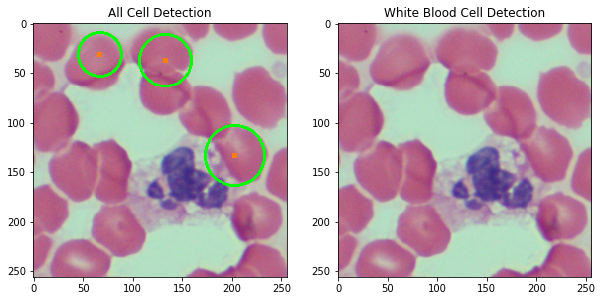

image-106.png	3	0	3


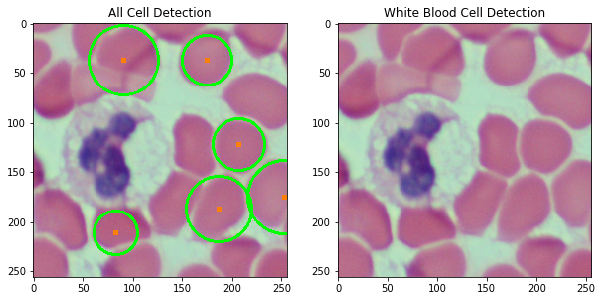

image-107.png	6	0	6


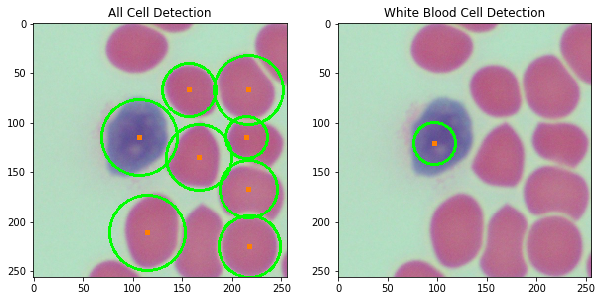

image-108.png	8	1	7


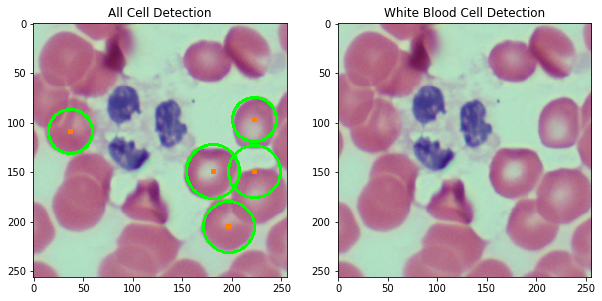

image-109.png	5	0	5


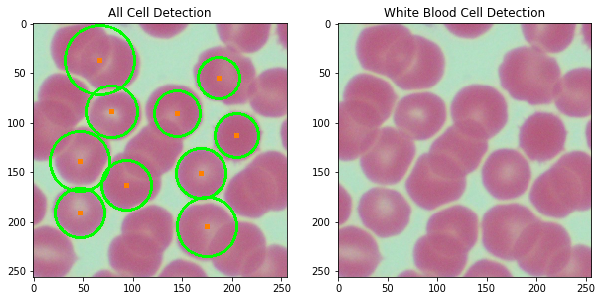

image-11.png	10	0	10


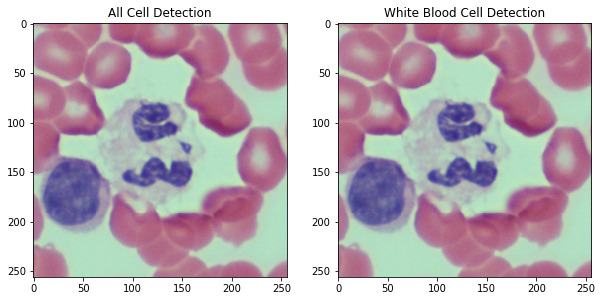

image-110.png	0	0	0


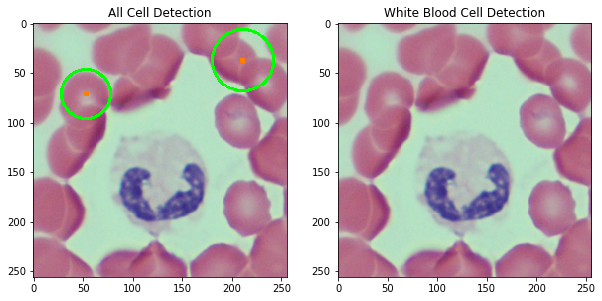

image-111.png	2	0	2


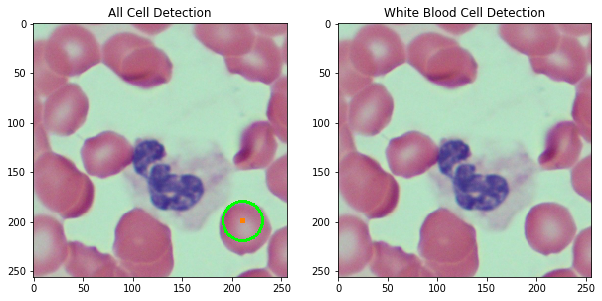

image-112.png	1	0	1


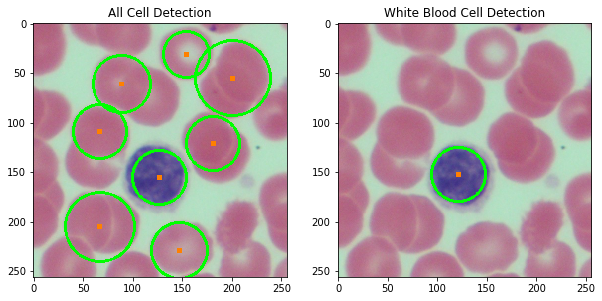

image-113.png	8	1	7


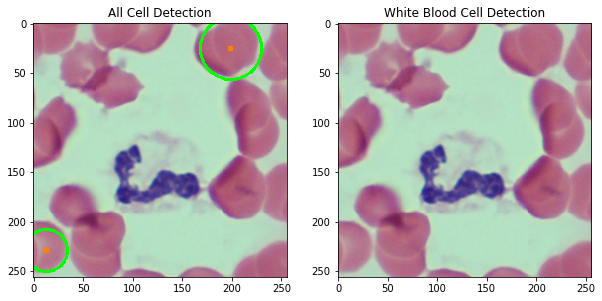

image-114.png	2	0	2


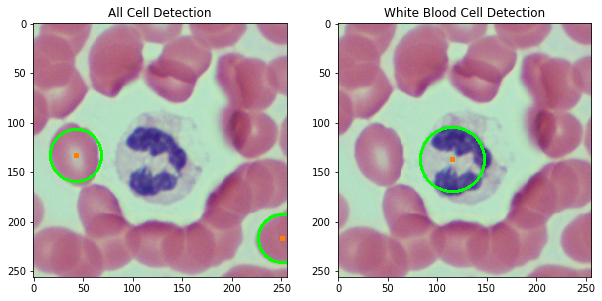

image-115.png	2	1	1


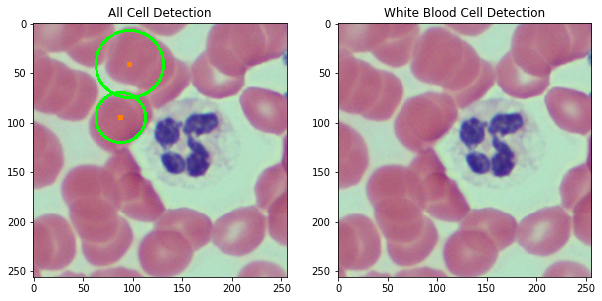

image-116.png	2	0	2


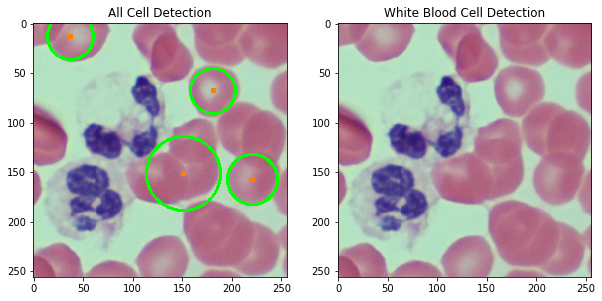

image-117.png	4	0	4


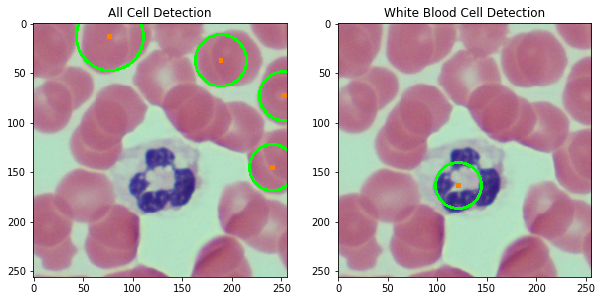

image-118.png	4	1	3


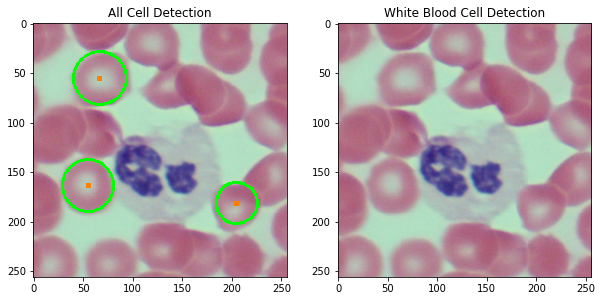

image-119.png	3	0	3


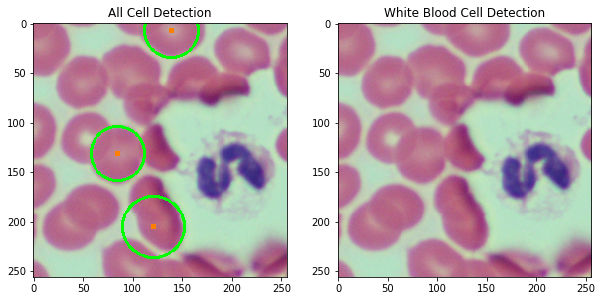

image-12.png	3	0	3


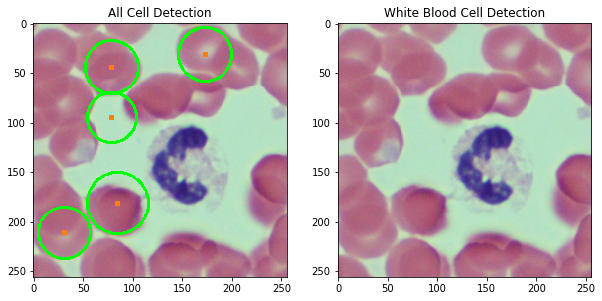

image-120.png	5	0	5


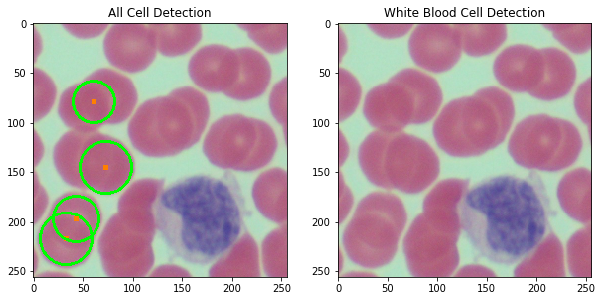

image-14.png	4	0	4


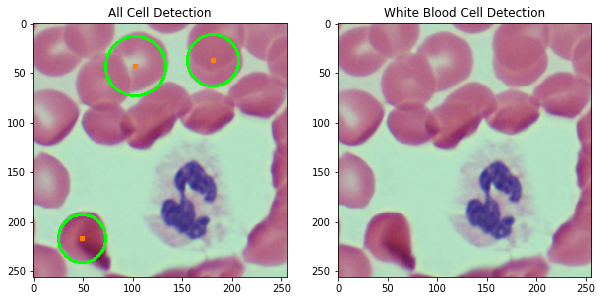

image-17.png	3	0	3


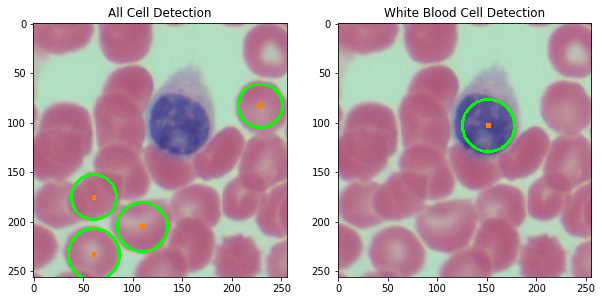

image-18.png	4	1	3


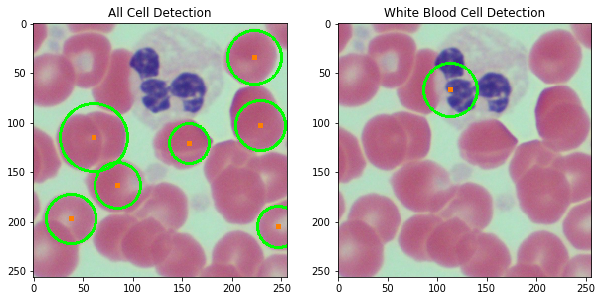

image-19.png	7	1	6


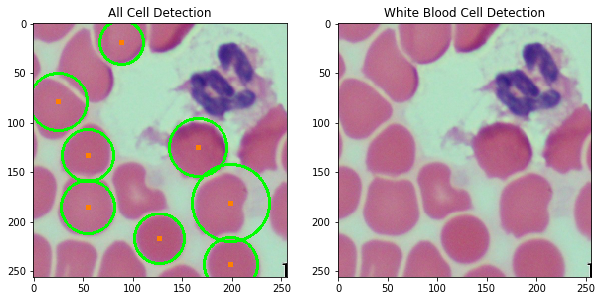

image-2.png	8	0	8


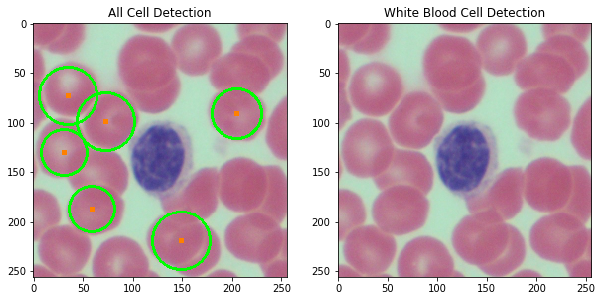

image-20.png	6	0	6


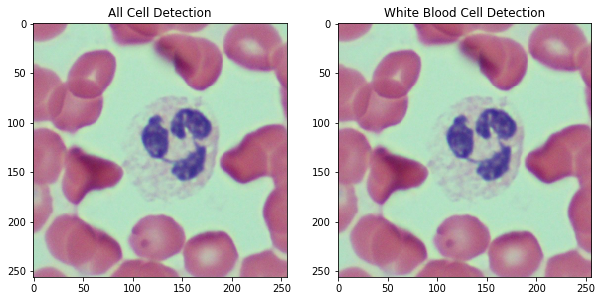

image-21.png	0	0	0


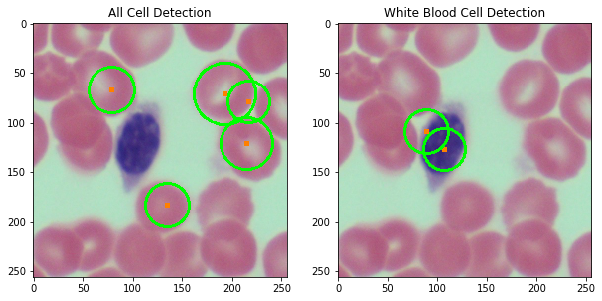

image-22.png	5	2	3


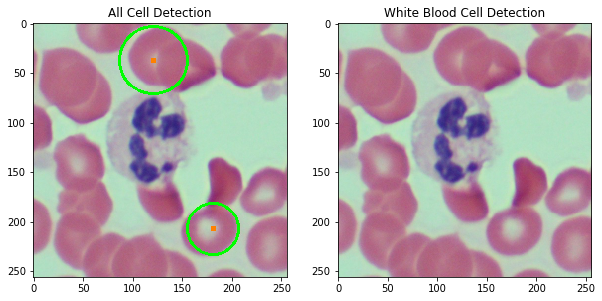

image-23.png	2	0	2


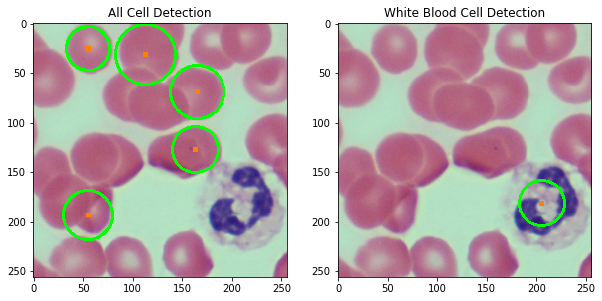

image-24.png	5	1	4


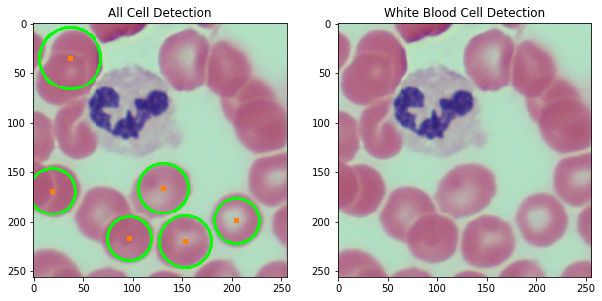

image-25.png	6	0	6


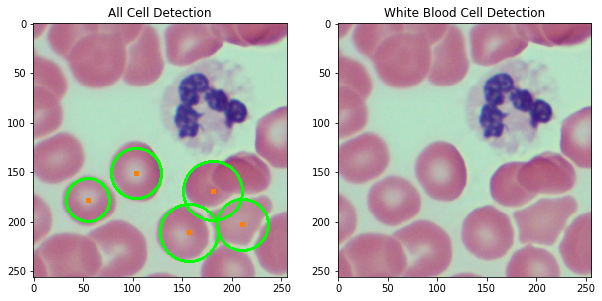

image-28.png	5	0	5


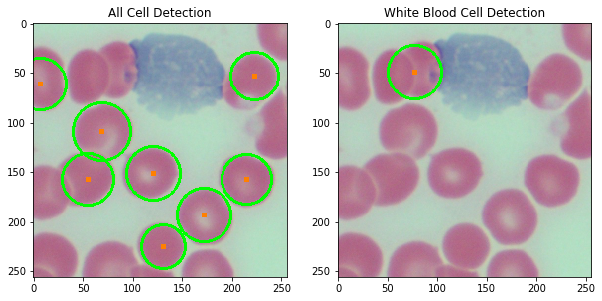

image-30.png	8	1	7


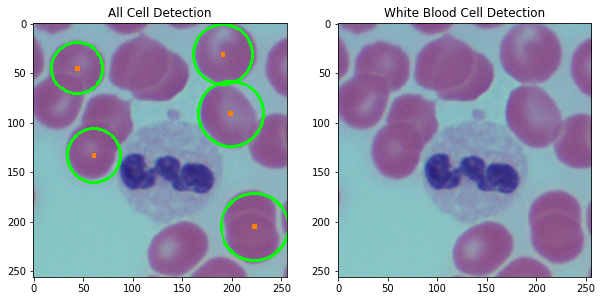

image-31.png	5	0	5


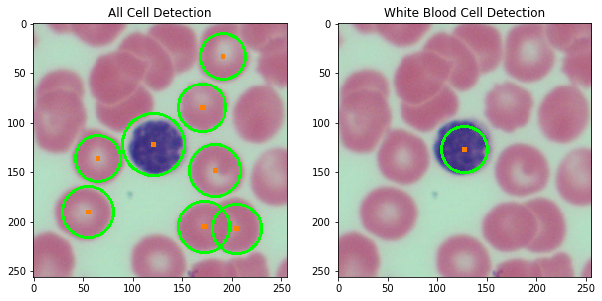

image-32.png	8	1	7


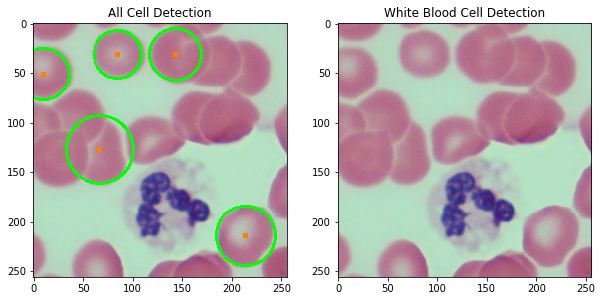

image-33.png	5	0	5


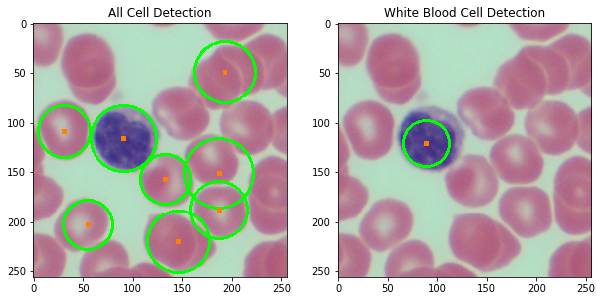

image-34.png	8	1	7


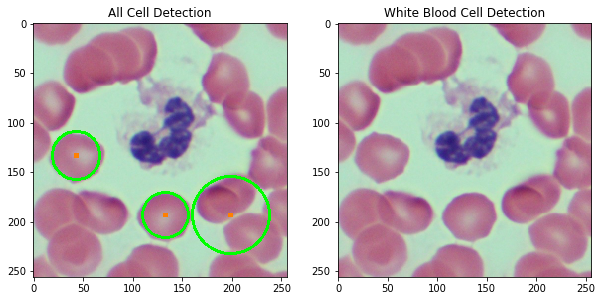

image-35.png	3	0	3


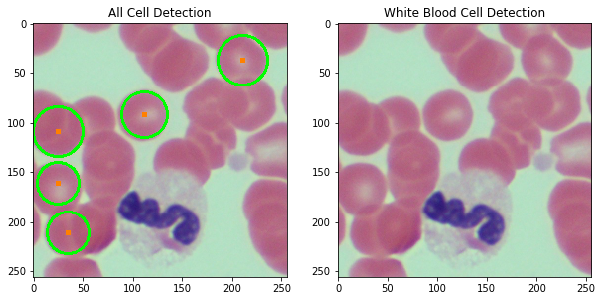

image-36.png	5	0	5


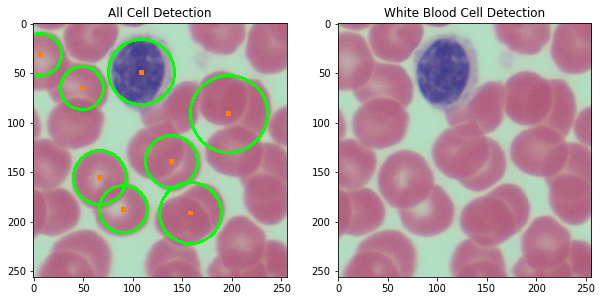

image-37.png	8	0	8


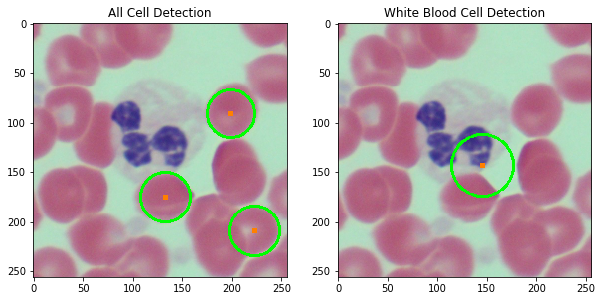

image-38.png	3	1	2


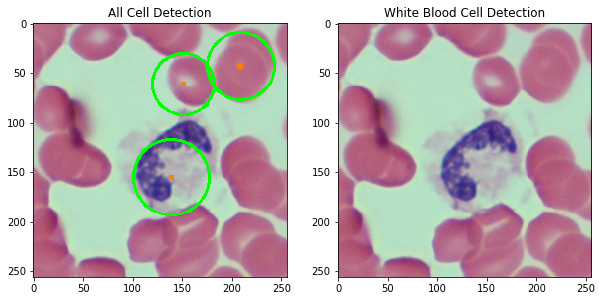

image-39.png	3	0	3


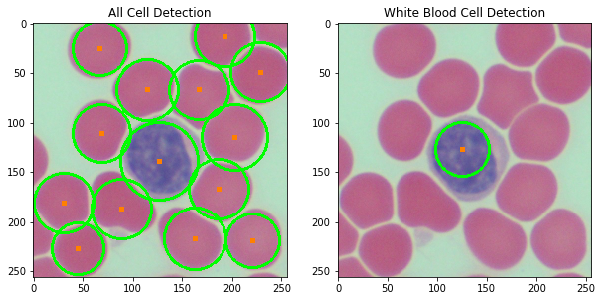

image-4.png	14	1	13


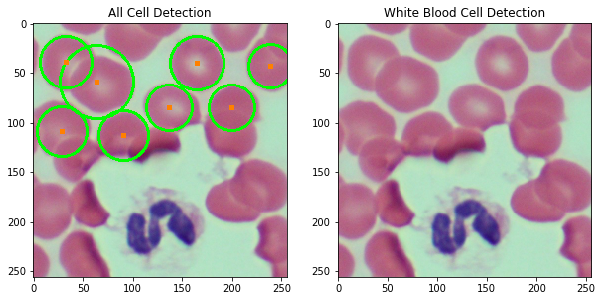

image-43.png	8	0	8


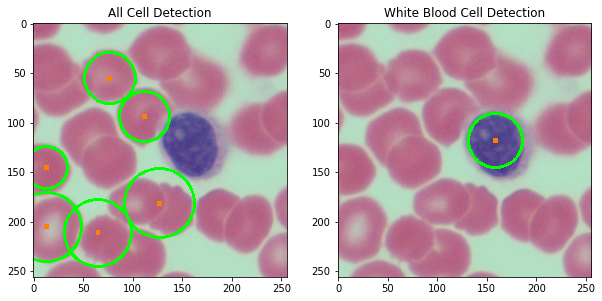

image-44.png	6	1	5


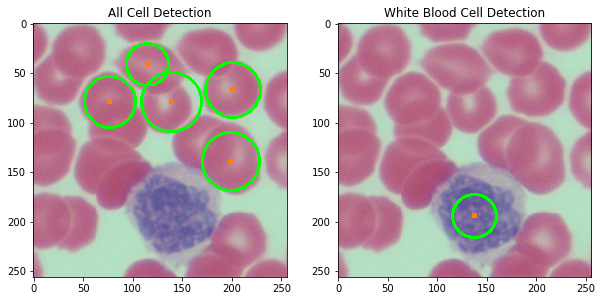

image-45.png	5	1	4


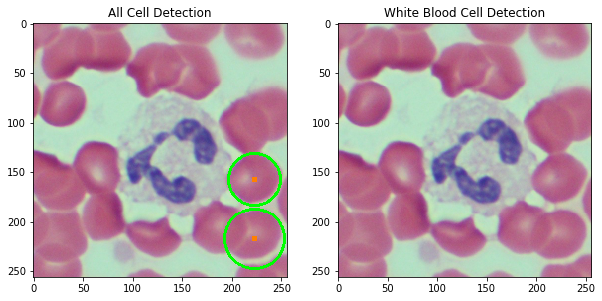

image-46.png	2	0	2


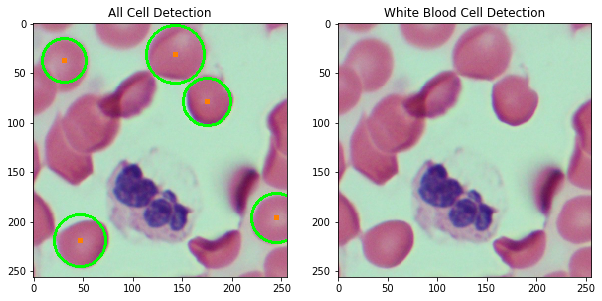

image-48.png	5	0	5


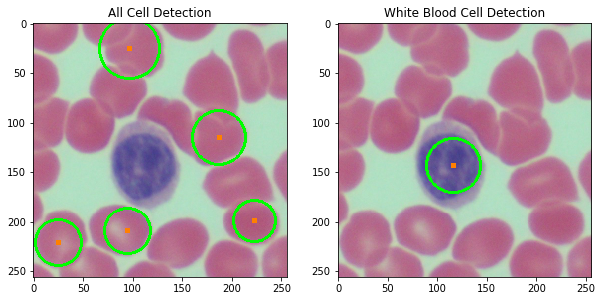

image-49.png	5	1	4


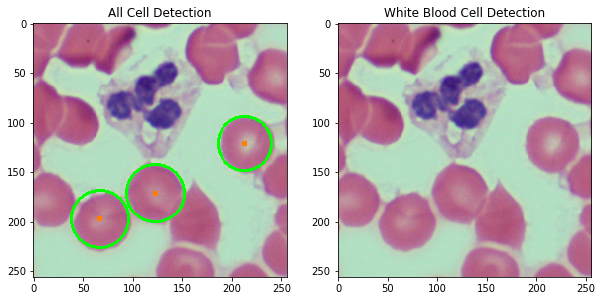

image-50.png	3	0	3


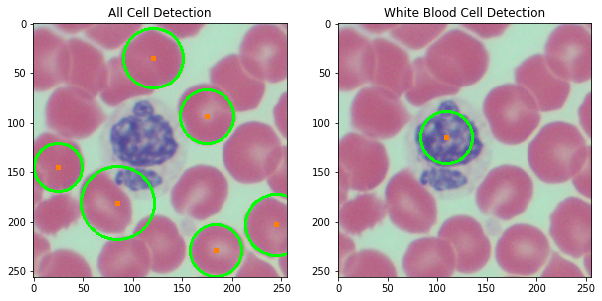

image-51.png	6	1	5


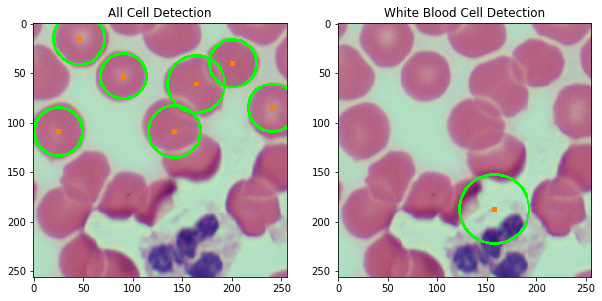

image-52.png	7	1	6


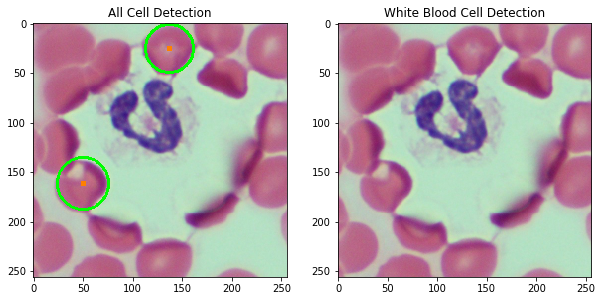

image-53.png	2	0	2


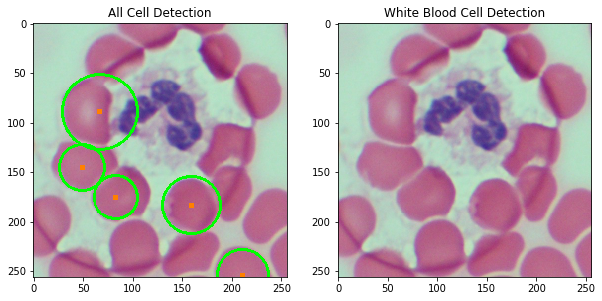

image-54.png	5	0	5


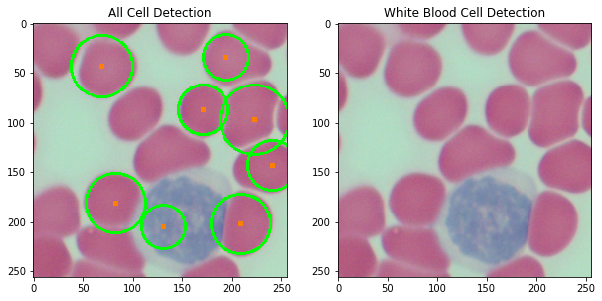

image-55.png	8	0	8


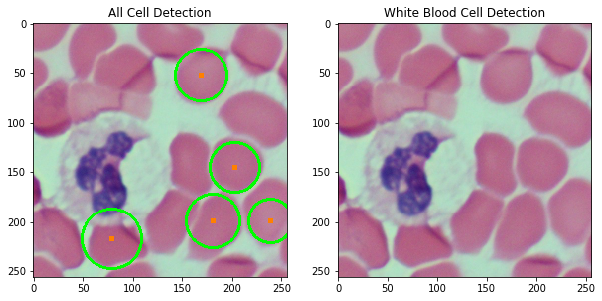

image-59.png	5	0	5


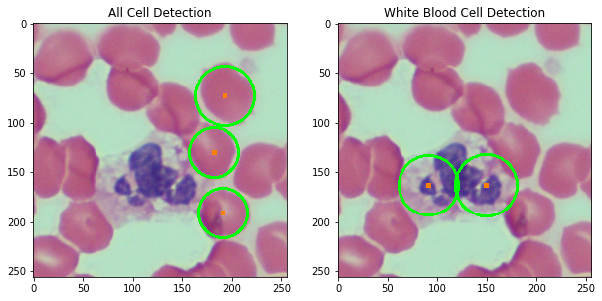

image-60.png	3	2	1


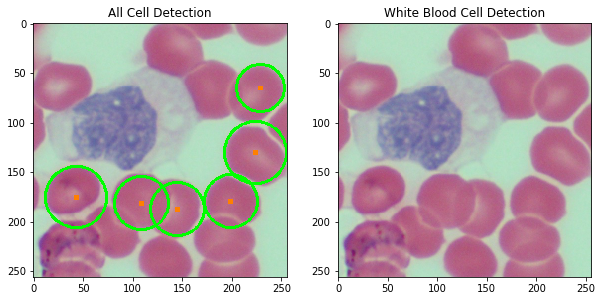

image-61.png	6	0	6


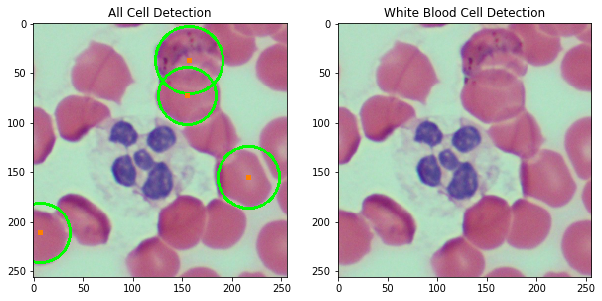

image-62.png	4	0	4


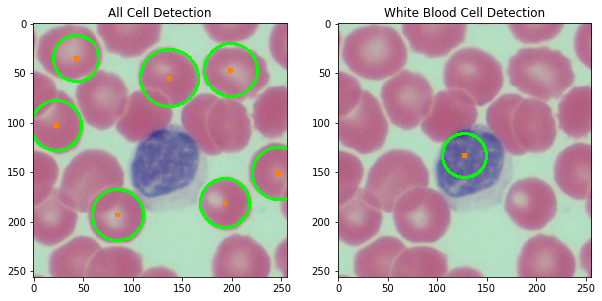

image-64.png	7	1	6


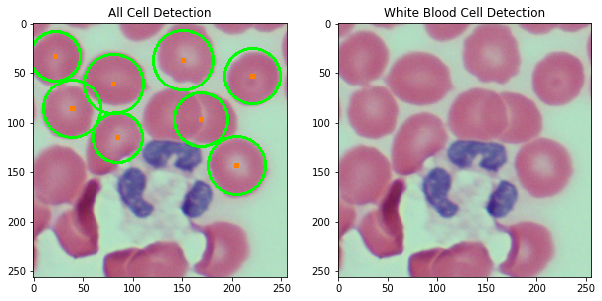

image-65.png	8	0	8


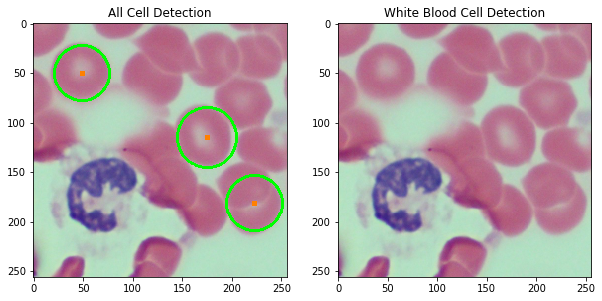

image-66.png	3	0	3


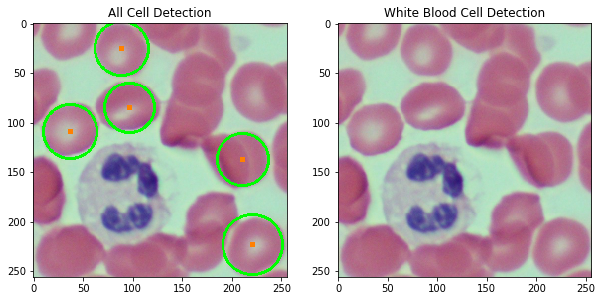

image-68.png	5	0	5


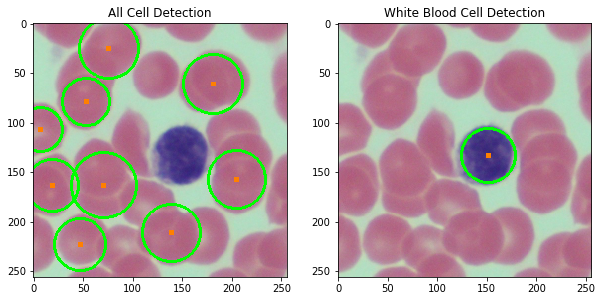

image-69.png	9	1	8


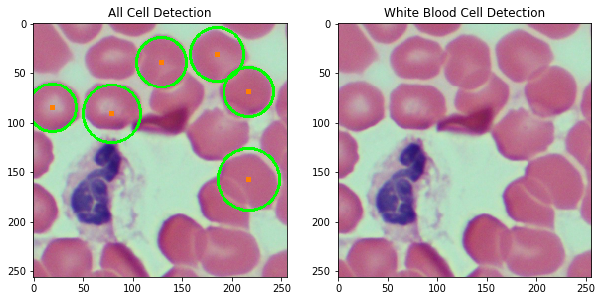

image-7.png	6	0	6


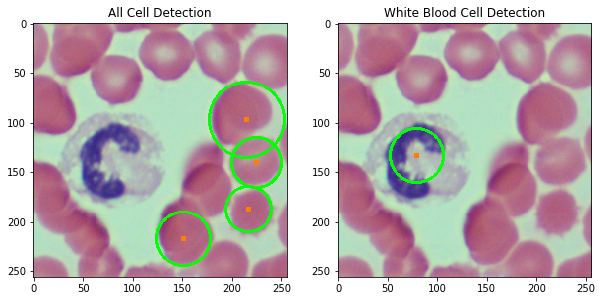

image-70.png	4	1	3


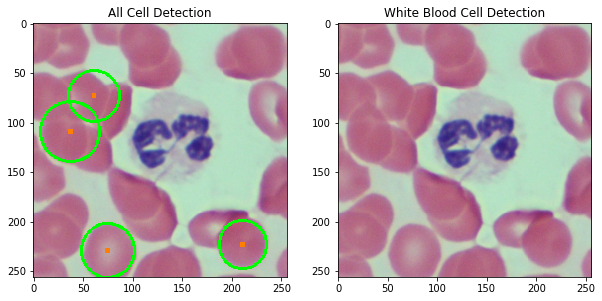

image-71.png	4	0	4


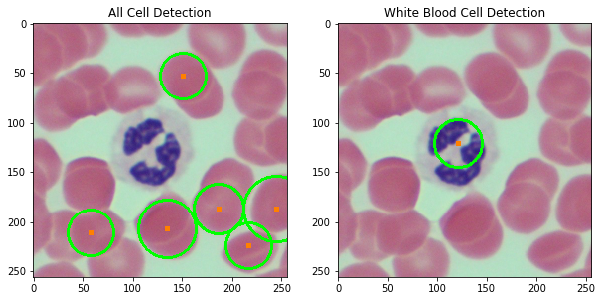

image-72.png	6	1	5


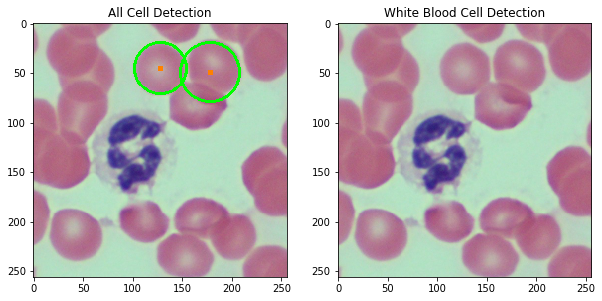

image-73.png	2	0	2


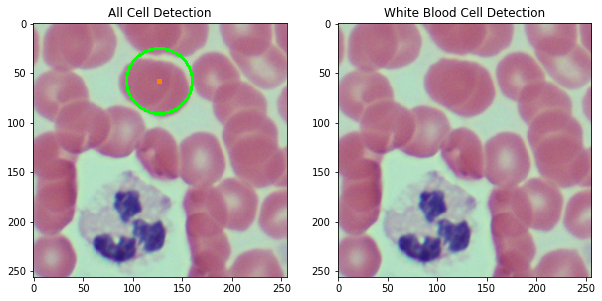

image-74.png	1	0	1


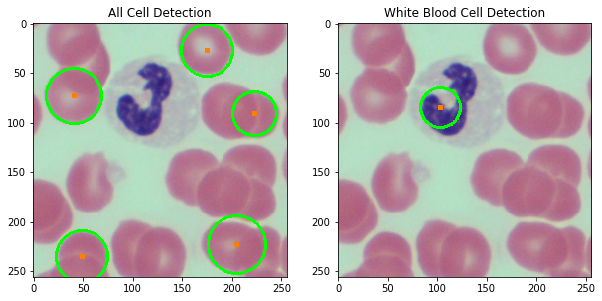

image-75.png	5	1	4


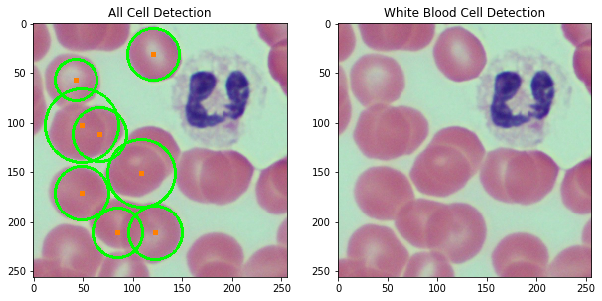

image-76.png	8	0	8


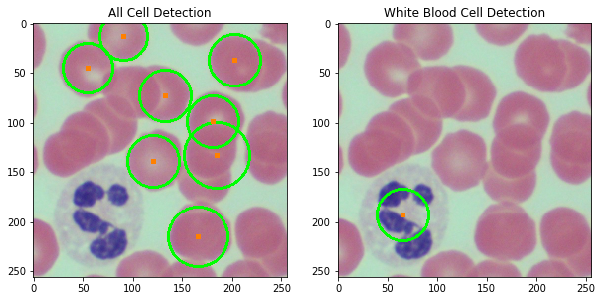

image-77.png	8	1	7


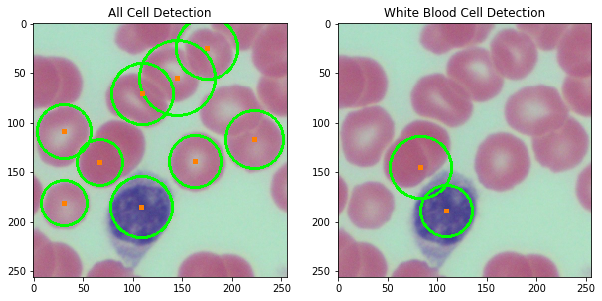

image-78.png	9	2	7


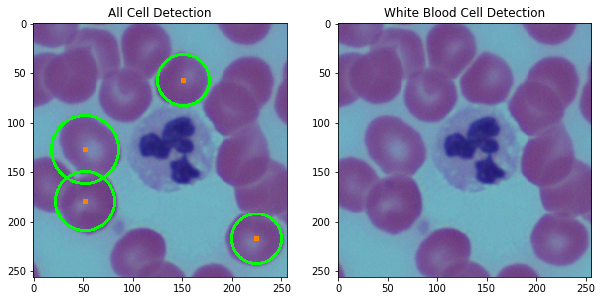

image-79.png	4	0	4


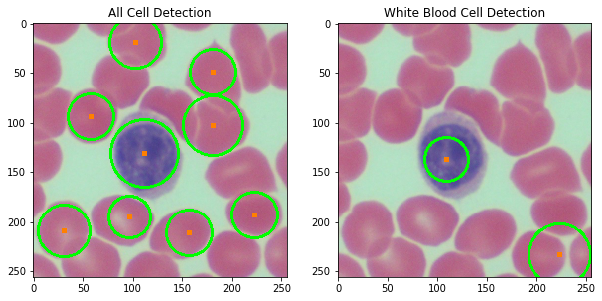

image-8.png	9	2	7


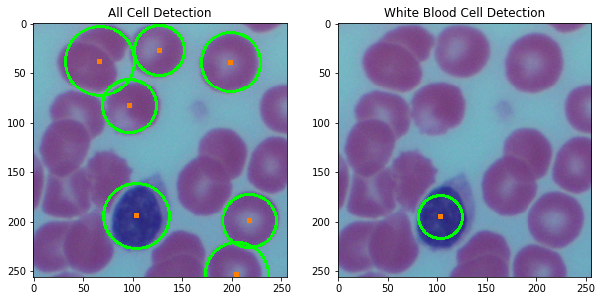

image-80.png	7	1	6


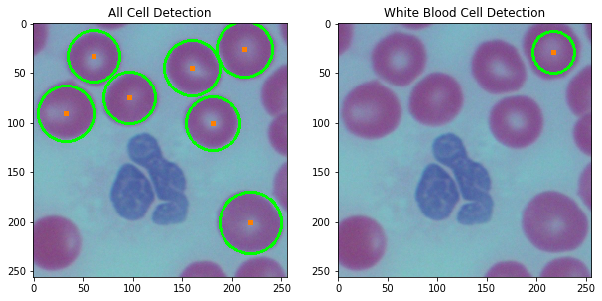

image-81.png	7	1	6


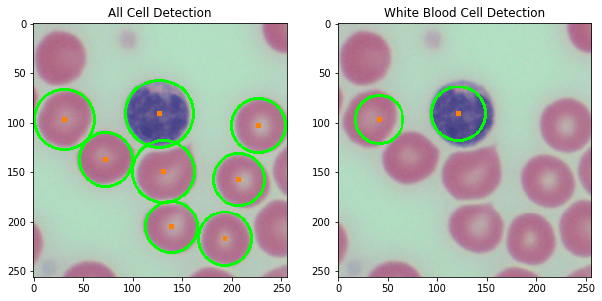

image-82.png	8	2	6


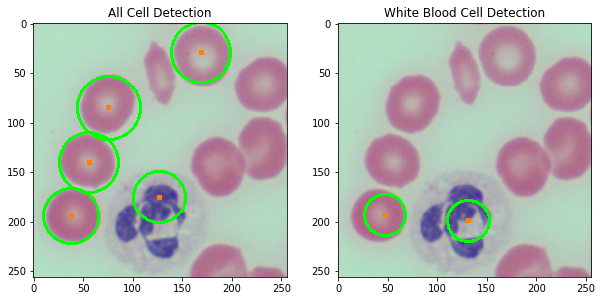

image-83.png	5	2	3


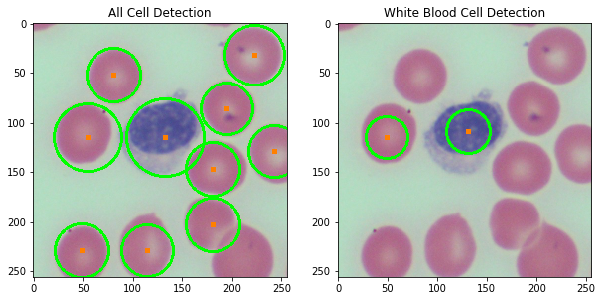

image-84.png	10	2	8


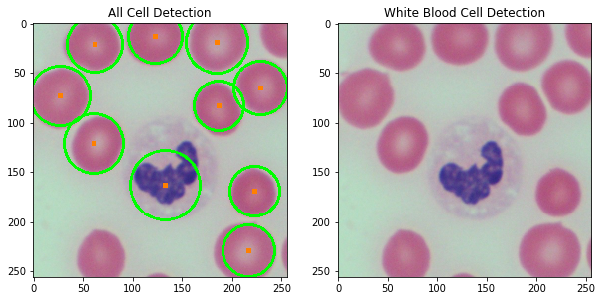

image-85.png	10	0	10


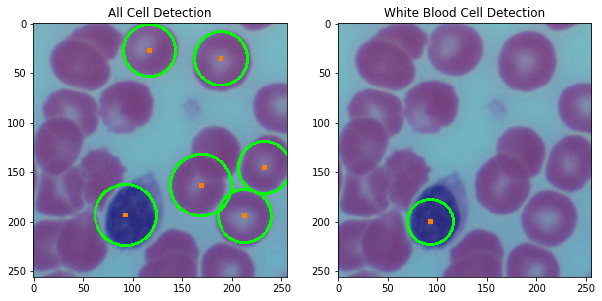

image-86.png	6	1	5


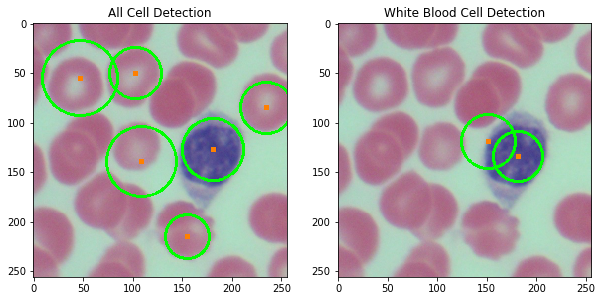

image-87.png	6	2	4


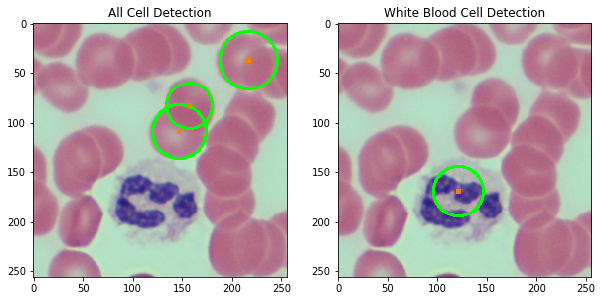

image-88.png	3	1	2


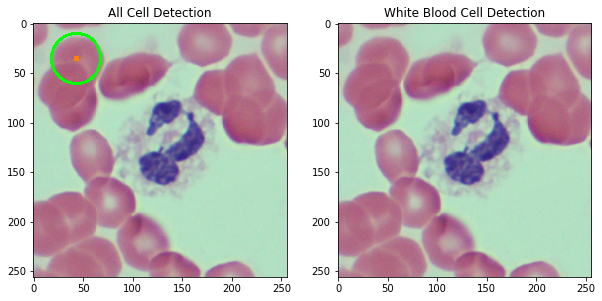

image-89.png	1	0	1


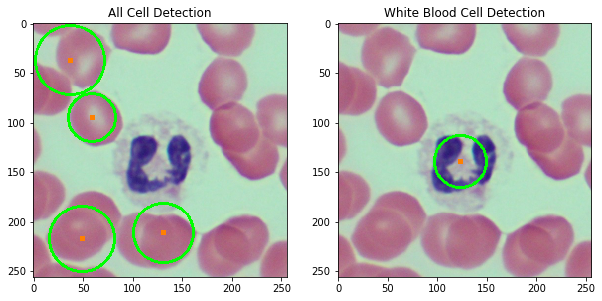

image-90.png	4	1	3


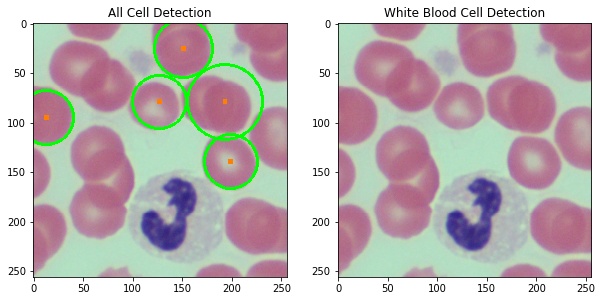

image-91.png	5	0	5


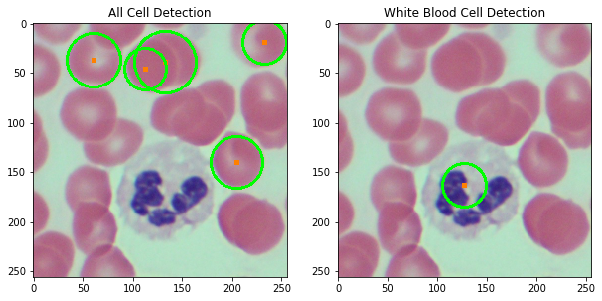

image-92.png	5	1	4


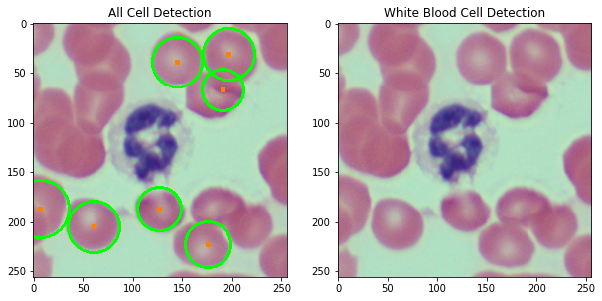

image-93.png	7	0	7


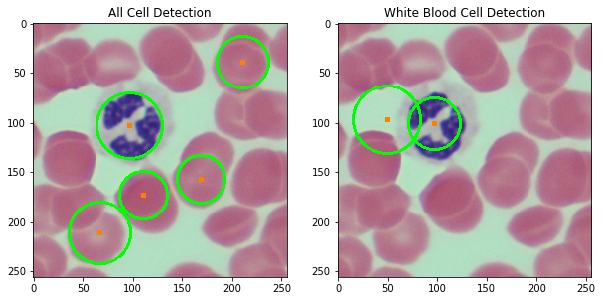

image-94.png	5	2	3


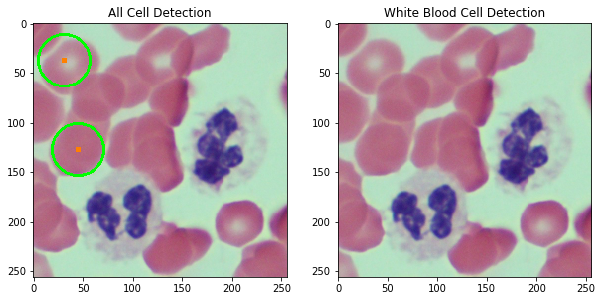

image-95.png	2	0	2


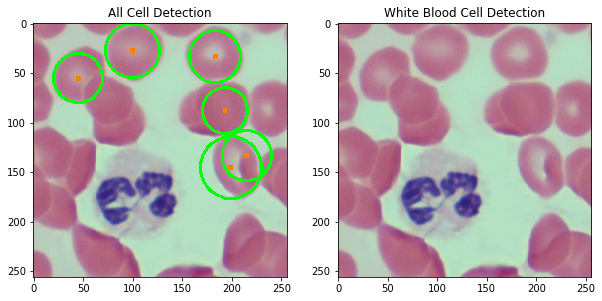

image-96.png	6	0	6


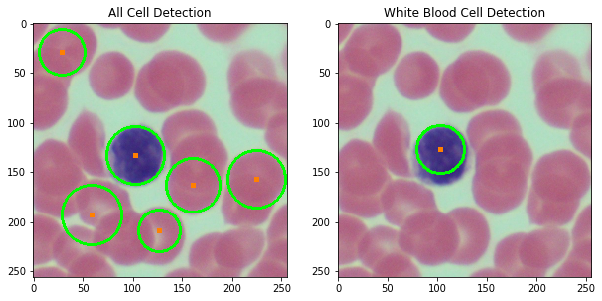

image-97.png	6	1	5


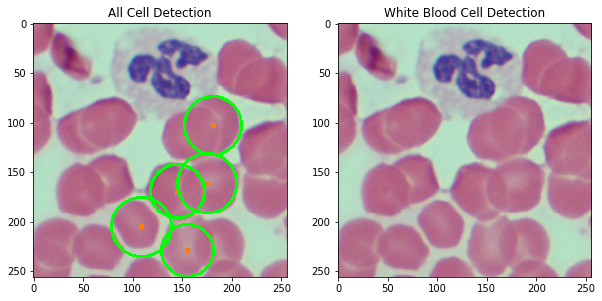

image-99.png	5	0	5


In [11]:
#Initalize List
Stat = [[0 for x in range(4)] for y in range(len(files))]

print('Image\t\tAll\tWBC\tRBC \n')

for j in range(len(files)):
    Stat[j][0] = os.path.basename(files[j])
    A,W,R = All_in_One(files[j])
    
    Stat[j][1] = A
    Stat[j][2] = W
    Stat[j][3] = R
    
    print('{}\t{}\t{}\t{}'.format(Stat[j][0],Stat[j][1],Stat[j][2],Stat[j][3]) )

# Testing

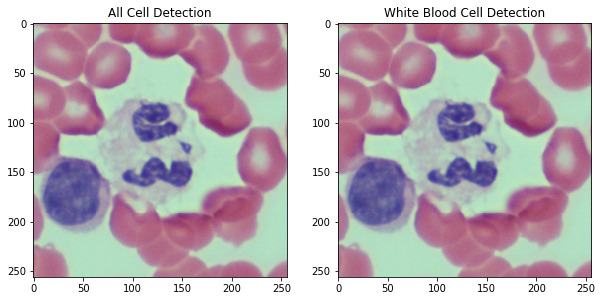

(0, 0, 0)

In [12]:
data_directory = os.path.join('.', 'Data')
#Sample = 'sample.png' 
Sample = 'image-110.png'
filename= os.path.join(data_directory, Sample) 

"""
edge_all,edge_white = Enhance(filename)
img_all, count_all = Detect(edge_all,filename,1)
img_white, count_white = Detect(edge_white,filename,0)
"""

All_in_One(filename)

